In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from sklearn.impute import SimpleImputer 

import warnings
warnings.filterwarnings('ignore')

In [2]:
taxi_data= pd.read_csv(r"D:\Datasets\archive(2)\sigma_cabs.csv")
test_data= pd.read_csv(r"D:\Datasets\archive(2)\test.csv")

In [3]:
#Shape of data
taxi_data.shape, test_data.shape

((131662, 14), (87395, 13))

In [4]:
taxi_data.head()

,Trip_ID,Trip_Distance,Type_of_Cab,Customer_Since_Months,Life_Style_Index,Confidence_Life_Style_Index,Destination_Type,Customer_Rating,Cancellation_Last_1Month,Var1,Var2,Var3,Gender,Surge_Pricing_Type
0,T0005689460,6.77,B,1.0,2.42769,A,A,3.90500,0,40.0,46,60,Female,2
1,T0005689461,29.47,B,10.0,2.78245,B,A,3.45000,0,38.0,56,78,Male,2
2,T0005689464,41.58,NaN,10.0,NaN,NaN,E,3.50125,2,NaN,56,77,Male,2
3,T0005689465,61.56,C,10.0,NaN,NaN,A,3.45375,0,NaN,52,74,Male,3
4,T0005689467,54.95,C,10.0,3.03453,B,A,3.40250,4,51.0,49,102,Male,2


In [5]:
#Check the statistics of data

taxi_data.describe()

,Trip_Distance,Customer_Since_Months,Life_Style_Index,Customer_Rating,Cancellation_Last_1Month,Var1,Var2,Var3,Surge_Pricing_Type
count,131662.000000,125742.000000,111469.000000,131662.000000,131662.000000,60632.000000,131662.000000,131662.000000,131662.000000
mean,44.200909,6.016661,2.802064,2.849458,0.782838,64.202698,51.202800,75.099019,2.155747
std,25.522882,3.626887,0.225796,0.980675,1.037559,21.820447,4.986142,11.578278,0.738164
min,0.310000,0.000000,1.596380,0.001250,0.000000,30.000000,40.000000,52.000000,1.000000
25%,24.580000,3.000000,2.654730,2.152500,0.000000,46.000000,48.000000,67.000000,2.000000
50%,38.200000,6.000000,2.798050,2.895000,0.000000,61.000000,50.000000,74.000000,2.000000
75%,60.730000,10.000000,2.946780,3.582500,1.000000,80.000000,54.000000,82.000000,3.000000
max,109.230000,10.000000,4.875110,5.000000,8.000000,210.000000,124.000000,206.000000,3.000000


In [6]:
# plt.pairplot(taxi_data)

In [7]:
# Check the type od the columns

taxi_data.dtypes

Trip_ID                         object
Trip_Distance                  float64
Type_of_Cab                     object
Customer_Since_Months          float64
Life_Style_Index               float64
Confidence_Life_Style_Index     object
Destination_Type                object
Customer_Rating                float64
Cancellation_Last_1Month         int64
Var1                           float64
Var2                             int64
Var3                             int64
Gender                          object
Surge_Pricing_Type               int64
dtype: object

In [8]:
#Seperate out categorical and numerical data

taxi_df_copy= taxi_data.iloc[:,1:]

numerical_data= taxi_df_copy.select_dtypes(include=['int64','float64'])
categorical_data= taxi_df_copy.select_dtypes(exclude=['int64','float64'])

print(f'Numerical Data:\n\t{numerical_data.columns}')

print(f'\nCategorical Data:\n\t{categorical_data.columns}')

Numerical Data:
	Index(['Trip_Distance', 'Customer_Since_Months', 'Life_Style_Index',
       'Customer_Rating', 'Cancellation_Last_1Month', 'Var1', 'Var2', 'Var3',
       'Surge_Pricing_Type'],
      dtype='object')

Categorical Data:
	Index(['Type_of_Cab', 'Confidence_Life_Style_Index', 'Destination_Type',
       'Gender'],
      dtype='object')


In [9]:
#Check Null Values

def check_null():
    null_data= taxi_data.isna().sum()
    per_null_data= (null_data/ taxi_data.shape[0])*100

    null_df= pd.DataFrame({'total Nulls:':null_data, 'Percentage of Nulls':per_null_data})
    
    return null_df

In [10]:
check_null()

,total Nulls:,Percentage of Nulls
Trip_ID,0,0.000000
Trip_Distance,0,0.000000
Type_of_Cab,20210,15.349911
Customer_Since_Months,5920,4.496362
Life_Style_Index,20193,15.336999
Confidence_Life_Style_Index,20193,15.336999
Destination_Type,0,0.000000
Customer_Rating,0,0.000000
Cancellation_Last_1Month,0,0.000000
Var1,71030,53.948748


In [11]:
# taxi_data.info()

In [12]:
taxi_data['Type_of_Cab'].value_counts()

Type_of_Cab
B    31136
C    28122
A    21569
D    18991
E    11634
Name: count, dtype: int64

In [13]:
#Fill NA's of Type of Cab with the ffill or bfill

taxi_data['Type_of_Cab'].fillna(method= 'ffill', inplace=True)

In [14]:
#Lets check the statistic and description of Customer_Since_Months column 

taxi_data['Customer_Since_Months'].describe()

count    125742.000000
mean          6.016661
std           3.626887
min           0.000000
25%           3.000000
50%           6.000000
75%          10.000000
max          10.000000
Name: Customer_Since_Months, dtype: float64

In [15]:
taxi_data['Customer_Since_Months'].value_counts()

Customer_Since_Months
10.0    42680
2.0     11621
3.0     10351
0.0     10169
5.0      8641
1.0      8297
4.0      7726
7.0      7407
6.0      7375
8.0      6328
9.0      5147
Name: count, dtype: int64

In [16]:
# Fill null values of Customer_Since_Months  with the mean 

# sum= 0
# count= 0
# avg = 0

# for i in taxi_data['Customer_Since_Months'].value_counts().items():
# #     print(i[0],i[1])
    
#     sum+=i[0]*i[1]
#     count+= i[1]
# #     print(sum, count)

# avg=round(sum/count, 0)


taxi_data['Customer_Since_Months'].fillna(taxi_data['Customer_Since_Months'].mean(), inplace=True)

In [17]:
taxi_data['Customer_Since_Months'].isna().sum()

0

In [18]:
#For other null columns lets check how important it is for the target column by taking correlation
# taxi_data.loc[:,taxi_data.columns!='Trip_ID']
taxi_data.iloc[:,1:]

,Trip_Distance,Type_of_Cab,Customer_Since_Months,Life_Style_Index,Confidence_Life_Style_Index,Destination_Type,Customer_Rating,Cancellation_Last_1Month,Var1,Var2,Var3,Gender,Surge_Pricing_Type
0,6.77,B,1.0,2.42769,A,A,3.90500,0,40.0,46,60,Female,2
1,29.47,B,10.0,2.78245,B,A,3.45000,0,38.0,56,78,Male,2
2,41.58,B,10.0,NaN,NaN,E,3.50125,2,NaN,56,77,Male,2
3,61.56,C,10.0,NaN,NaN,A,3.45375,0,NaN,52,74,Male,3
4,54.95,C,10.0,3.03453,B,A,3.40250,4,51.0,49,102,Male,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
131657,11.72,D,1.0,2.74229,A,A,3.28500,0,61.0,47,76,Male,3
131658,74.81,C,7.0,2.81059,C,A,0.44500,0,NaN,63,88,Male,2
131659,40.17,C,10.0,2.99565,B,A,3.33625,0,NaN,48,75,Female,2
131660,46.88,B,4.0,3.04744,A,B,4.15750,1,47.0,54,79,Male,2


In [19]:
taxi_data['Customer_Since_Months'].dtype

dtype('float64')

In [20]:
taxi_corr= taxi_data.corr(numeric_only=True)
taxi_corr

,Trip_Distance,Customer_Since_Months,Life_Style_Index,Customer_Rating,Cancellation_Last_1Month,Var1,Var2,Var3,Surge_Pricing_Type
Trip_Distance,1.000000,0.114340,0.509482,-0.054654,-0.007686,-0.045468,0.200456,0.231706,0.135928
Customer_Since_Months,0.114340,1.000000,0.129466,-0.049001,-0.006187,-0.009895,0.041766,0.110830,0.027202
Life_Style_Index,0.509482,0.129466,1.000000,0.205824,0.074023,-0.091307,0.234754,0.329312,-0.080108
Customer_Rating,-0.054654,-0.049001,0.205824,1.000000,0.003595,-0.010968,-0.302968,-0.227531,-0.155279
Cancellation_Last_1Month,-0.007686,-0.006187,0.074023,0.003595,1.000000,0.010953,0.095830,0.128686,0.185646
Var1,-0.045468,-0.009895,-0.091307,-0.010968,0.010953,1.000000,-0.046755,-0.061993,-0.040735
Var2,0.200456,0.041766,0.234754,-0.302968,0.095830,-0.046755,1.000000,0.683437,0.003437
Var3,0.231706,0.110830,0.329312,-0.227531,0.128686,-0.061993,0.683437,1.000000,-0.039309
Surge_Pricing_Type,0.135928,0.027202,-0.080108,-0.155279,0.185646,-0.040735,0.003437,-0.039309,1.000000


<Axes: >

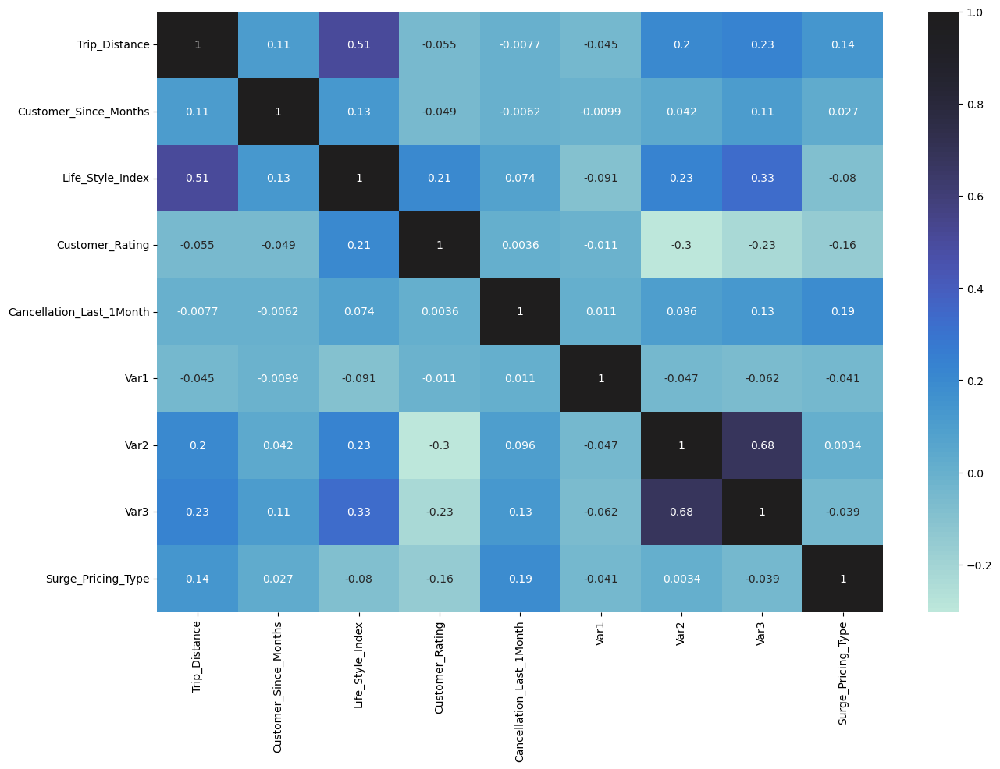

In [21]:
plt.figure(figsize=(15, 10))
sns.heatmap(taxi_corr,annot=True, center=True)

In [22]:
#drop Life_Style_Index Nan rows
taxi_data= taxi_data.dropna(subset=['Life_Style_Index'])

In [23]:
check_null()

,total Nulls:,Percentage of Nulls
Trip_ID,0,0.000000
Trip_Distance,0,0.000000
Type_of_Cab,0,0.000000
Customer_Since_Months,0,0.000000
Life_Style_Index,0,0.000000
Confidence_Life_Style_Index,0,0.000000
Destination_Type,0,0.000000
Customer_Rating,0,0.000000
Cancellation_Last_1Month,0,0.000000
Var1,60099,53.915438


In [24]:
#Fill last Var1 column 

taxi_data['Var1'].describe()

count    51370.000000
mean        64.191279
std         21.822343
min         30.000000
25%         46.000000
50%         61.000000
75%         80.000000
max        210.000000
Name: Var1, dtype: float64

<Axes: >

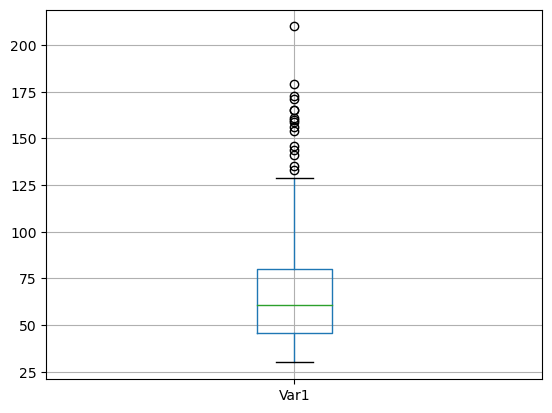

In [25]:
taxi_data.boxplot(column='Var1')

In [26]:
taxi_data['Var1']= taxi_data['Var1'].fillna(taxi_data['Var1'].mean())

In [27]:
#Check if all the null values are filled or not

check_null()

,total Nulls:,Percentage of Nulls
Trip_ID,0,0.0
Trip_Distance,0,0.0
Type_of_Cab,0,0.0
Customer_Since_Months,0,0.0
Life_Style_Index,0,0.0
Confidence_Life_Style_Index,0,0.0
Destination_Type,0,0.0
Customer_Rating,0,0.0
Cancellation_Last_1Month,0,0.0
Var1,0,0.0


<Axes: xlabel='Surge_Pricing_Type', ylabel='count'>

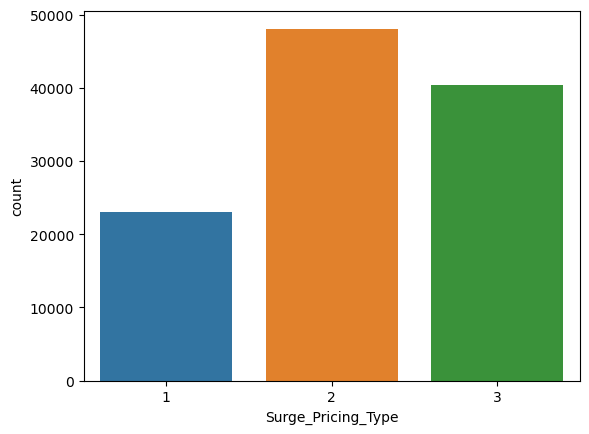

In [28]:
sns.countplot(data=taxi_data, x='Surge_Pricing_Type')

In [29]:
taxi_data_sort_by_TOC=taxi_data.sort_values(by='Type_of_Cab')

<Axes: xlabel='Type_of_Cab', ylabel='count'>

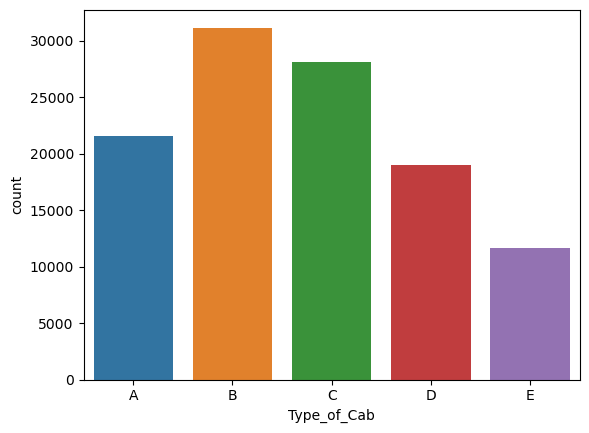

In [30]:
sns.countplot(data=taxi_data_sort_by_TOC, x='Type_of_Cab')

<Axes: xlabel='Customer_Since_Months', ylabel='count'>

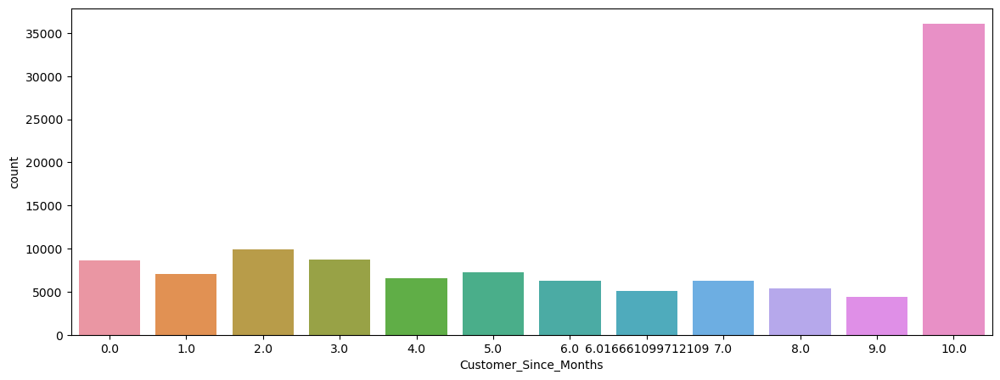

In [31]:
plt.figure(figsize=(14,5))
sns.countplot(data=taxi_data, x='Customer_Since_Months')

In [32]:
pk=taxi_data['Customer_Since_Months'][(taxi_data['Customer_Since_Months']>6.0) & (taxi_data['Customer_Since_Months']<6.6)]
pk

13        6.016661
18        6.016661
35        6.016661
107       6.016661
119       6.016661
            ...   
131495    6.016661
131574    6.016661
131591    6.016661
131612    6.016661
131614    6.016661
Name: Customer_Since_Months, Length: 5063, dtype: float64

In [33]:
sh=taxi_data['Customer_Since_Months'].where((taxi_data['Customer_Since_Months']>6.0) & (taxi_data['Customer_Since_Months']<6.6), 6.0)



In [34]:
taxi_data.columns

Index(['Trip_ID', 'Trip_Distance', 'Type_of_Cab', 'Customer_Since_Months',
       'Life_Style_Index', 'Confidence_Life_Style_Index', 'Destination_Type',
       'Customer_Rating', 'Cancellation_Last_1Month', 'Var1', 'Var2', 'Var3',
       'Gender', 'Surge_Pricing_Type'],
      dtype='object')

<Figure size 1000x800 with 0 Axes>

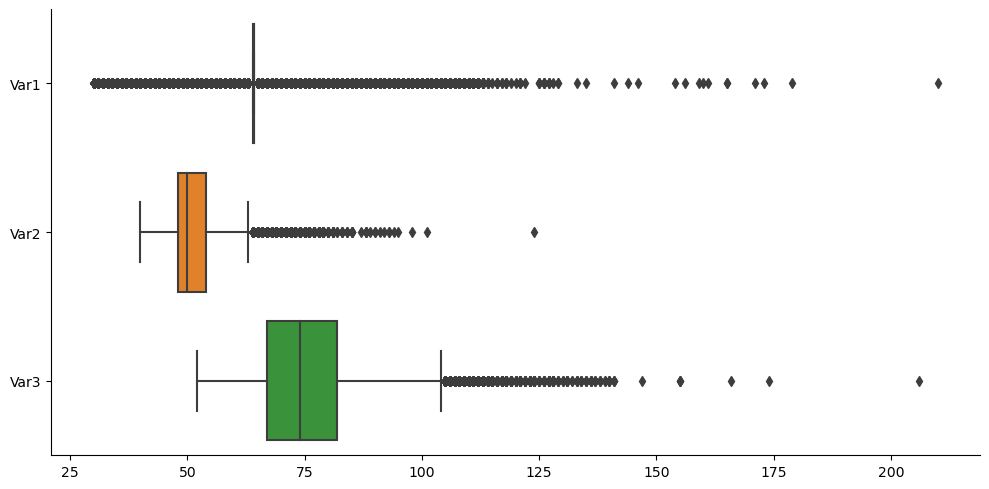

In [35]:
cats= [c for c in taxi_data.columns if taxi_data[c].dtypes=='object']

plt.figure(figsize=(10, 8))
sns.catplot(data= taxi_data[['Var1','Var2','Var3']], orient='h', kind= 'box', aspect=2)

# cats = [c for c in taxi_data.columns if taxi_data[c].dtypes == 'object']
# cats

<Axes: xlabel='Customer_Rating', ylabel='Life_Style_Index'>

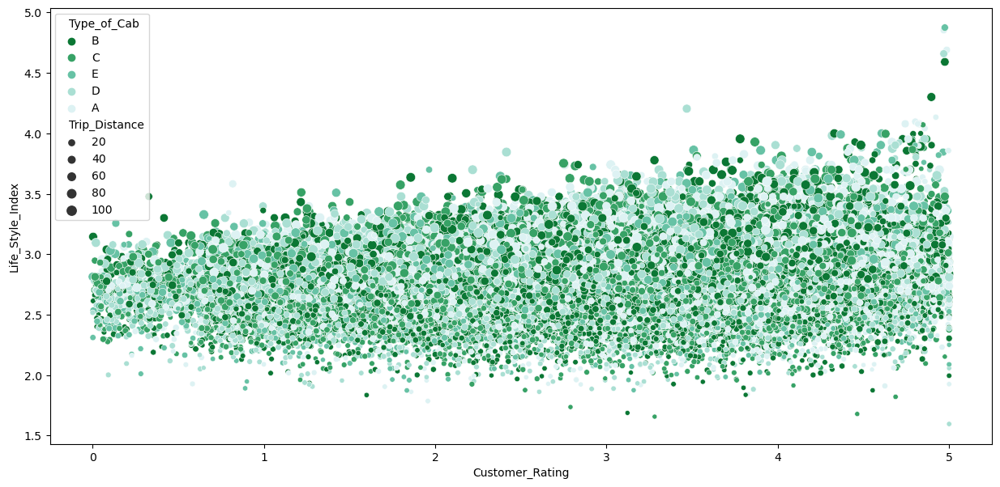

In [36]:
plt.figure(figsize=(15,7))

sns.scatterplot(data= taxi_data, x= 'Customer_Rating', y= 'Life_Style_Index', hue='Type_of_Cab', size='Trip_Distance', palette='BuGn_r')

In [37]:
taxi_data.columns

Index(['Trip_ID', 'Trip_Distance', 'Type_of_Cab', 'Customer_Since_Months',
       'Life_Style_Index', 'Confidence_Life_Style_Index', 'Destination_Type',
       'Customer_Rating', 'Cancellation_Last_1Month', 'Var1', 'Var2', 'Var3',
       'Gender', 'Surge_Pricing_Type'],
      dtype='object')

<Axes: xlabel='Type_of_Cab', ylabel='Surge_Pricing_Type'>

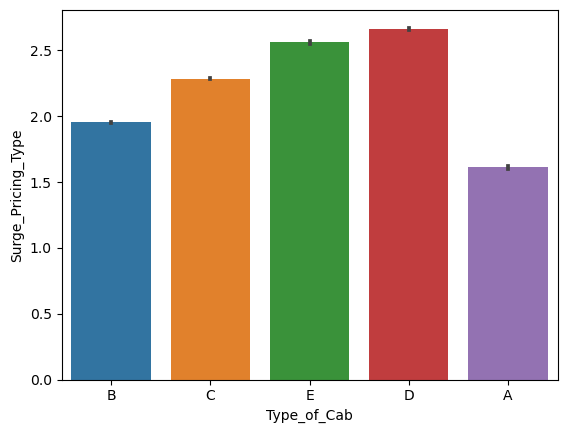

In [38]:
sns.barplot(data=taxi_data, x='Type_of_Cab', y= 'Surge_Pricing_Type' )

In [39]:
# px.bar(data_frame= taxi_data, x= 'Type_of_Cab',y= 'Customer_Rating',pal)

In [40]:
# sns.barplot(data=taxi_data, x='Customer_Rating', y= 'Surge_Pricing_Type' )

In [41]:
sns

<module 'seaborn' from 'C:\\Users\\varsha\\anaconda3\\Lib\\site-packages\\seaborn\\__init__.py'>

In [42]:
taxi_data['Customer_Rating'].value_counts()

Customer_Rating
3.35000    106
3.50000    104
2.75000    101
2.60000     96
3.05000     93
          ... 
0.31250      1
0.60750      1
0.35375      1
0.01250      1
0.61875      1
Name: count, Length: 3902, dtype: int64

### Q.1. How does the pricing changes according to the distance?

In [43]:
px.scatter(taxi_data, y='Life_Style_Index',x= 'Trip_Distance')

In [44]:
taxi_data['Trip_Distance'].value_counts()

Trip_Distance
30.74     56
30.18     56
29.58     54
31.66     54
30.62     52
          ..
79.15      1
90.61      1
99.37      1
103.81     1
90.35      1
Name: count, Length: 10205, dtype: int64

In [45]:
# sns.boxplot(data=taxi_data, x= 'Surge_Pricing_Type',y= 'Trip_Distance', orient='h' )

In [46]:
taxi_data.columns

Index(['Trip_ID', 'Trip_Distance', 'Type_of_Cab', 'Customer_Since_Months',
       'Life_Style_Index', 'Confidence_Life_Style_Index', 'Destination_Type',
       'Customer_Rating', 'Cancellation_Last_1Month', 'Var1', 'Var2', 'Var3',
       'Gender', 'Surge_Pricing_Type'],
      dtype='object')

<Axes: xlabel='Type_of_Cab', ylabel='Trip_Distance'>

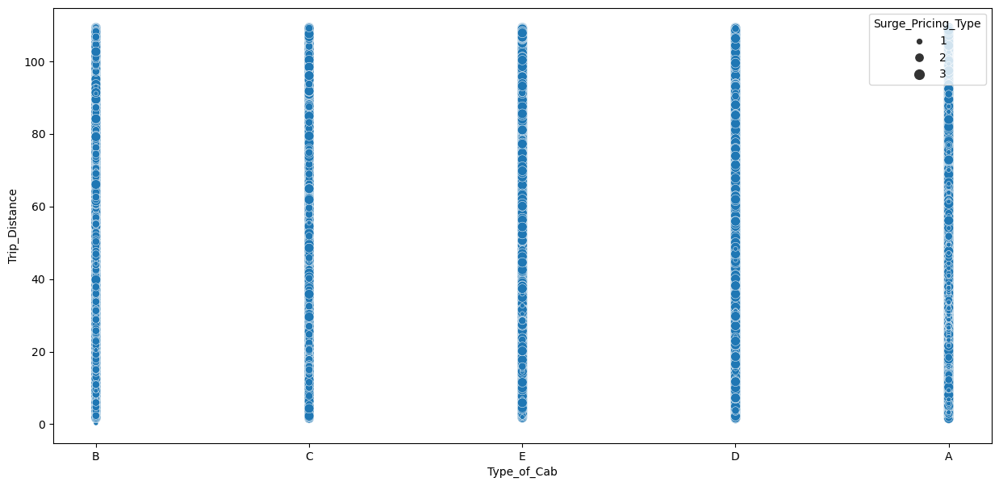

In [51]:
plt.figure(figsize=(15,7))

sns.scatterplot(data= taxi_data, x= 'Type_of_Cab', y= 'Trip_Distance', size='Surge_Pricing_Type', palette='BuGn_r')

In [ ]:
#https://www.kaggle.com/code/lvishalraju/taxi-pricing-logistic-regression-accu-69
#https://www.kaggle.com/code/arashnic/eda-and-bases